# Cancer Types and Stages

In [1]:
# importing libraries
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# load dataset from SHRS_smallDS.xlsx
cancer_type_df = pd.read_excel('lung_combined.xlsx',index_col=False)

# Select the stage,1 for Grade I, 2 for Grade II...0 for Unknown
stage = 1

In [2]:
cancer_type_df.shape

(25137, 11)

In [3]:
cancer_type_stage_df = cancer_type_df[cancer_type_df['Grade Recode'] == stage]
print(cancer_type_stage_df.shape)
print(cancer_type_stage_df.head())

(3333, 11)
    Histologic Type ICD-O-3  Regional nodes examined (1988+)  \
10                     8550                               10   
23                     8260                               95   
39                     8070                                0   
50                     8070                               13   
65                     8070                                8   

    Regional nodes positive (1988+)  Primary Site  Survived  Age  Tumor Size  \
10                                0           342         1   75           3   
23                                0           341         0   80           3   
39                               98           341         1   75           3   
50                                0           341         1   65           3   
65                                0           341         1   85          38   

    Grade Recode  Race  Sex  Marital status at diagnosis  
10             1     1    2                            5  
23   

In [5]:
from sklearn.model_selection import train_test_split
from fairlearn.reductions import ExponentiatedGradient, EqualizedOdds
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from aif360.sklearn.inprocessing import ExponentiatedGradientReduction

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# separate array into input and output components
X = cancer_type_stage_df.drop(['Survived', 'Grade Recode'], axis=1)
y = cancer_type_stage_df['Survived']

(X_train, X_test,
 y_train, y_test) = train_test_split(X, y, train_size=0.8, random_state=42)

In [7]:
prot_attr_cols = [colname for colname in X_train 
                  if "Sex" in colname or "Marital status at diagnosis" in colname 
                  or "Race" in colname]
prot_attr_cols

['Race', 'Sex', 'Marital status at diagnosis']

# 1. Logestic Regression

In [8]:
from sklearn.linear_model import LogisticRegression
lr_estimator = LogisticRegression(solver='liblinear')
lr_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=lr_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
lr_exp_grad_red.fit(X_train, y_train)
lr_egr_acc = lr_exp_grad_red.score(X_test, y_test)
print(lr_egr_acc)

0.6626686656671664


In [9]:
# Without fairness
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
lr_acc = accuracy_score(y_test, y_pred)
lr_acc

0.7901049475262368

## 1.1 SHAP For Logestic Regression

In [10]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

lr_explainer = shap.Explainer(lr_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
lr_shap_values = lr_explainer(X_test)

ExactExplainer explainer: 668it [00:24, 15.09it/s]                                                               


Mitigated Variable Importance Plot - Global Interpretation


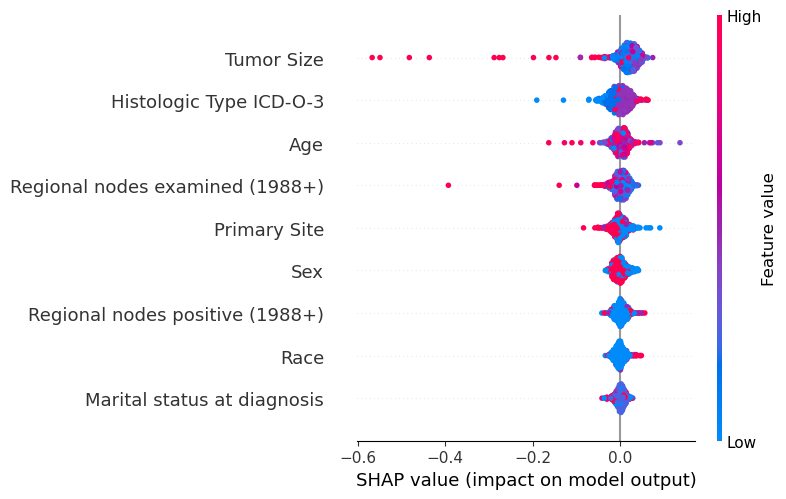

In [11]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(lr_shap_values, X_test)

In [12]:
# Create the explainer for unmitigated model
lr_unmitigated_explainer = shap.Explainer(lr.predict, X_train)
lr_unmitigated_shap_values = lr_unmitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


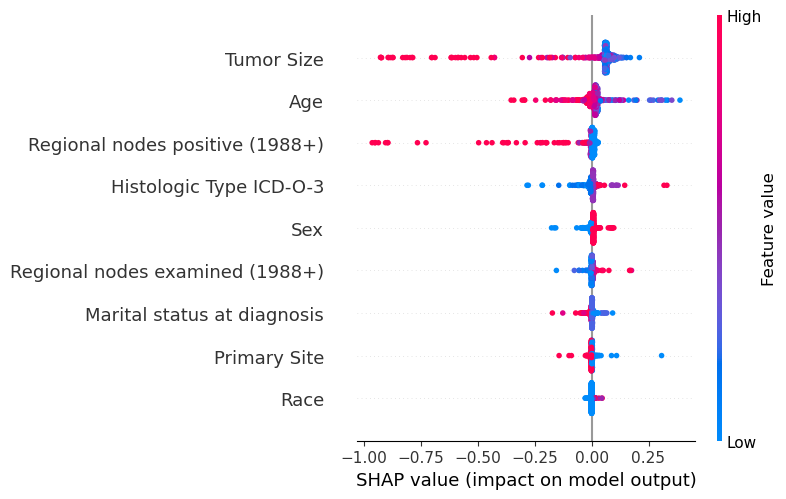

In [13]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(lr_unmitigated_shap_values, X_test)

## 1.2 LIME For Logestic Regression

In [14]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
lr_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [17]:
# predict_fn_rf = lambda x: rf.predict_proba(x).astype(float)
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
lr_exp = lr_explainer.explain_instance(X_test.iloc[i], lr_exp_grad_red.predict_proba)
lr_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not have valid feature names, but LogisticRegression was fitted with feature names
X does not

In [18]:
lr_exp = lr_explainer.explain_instance(X_test.iloc[i], lr.predict_proba)
lr_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but LogisticRegression was fitted with feature names


# 2. Decision Tree

In [19]:
from sklearn.tree import DecisionTreeClassifier
dt_estimator = DecisionTreeClassifier()
dt_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=dt_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
dt_exp_grad_red.fit(X_train, y_train)
dt_egr_acc = dt_exp_grad_red.score(X_test, y_test)
print(dt_egr_acc)

0.6941529235382309


In [20]:
# Without fairness
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
dt_acc = accuracy_score(y_test, y_pred)
dt_acc

0.7016491754122939

## 2.1 SHAP For Decision Tree

In [21]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
dt_explainer = shap.Explainer(dt_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
dt_shap_values = dt_explainer(X_test)

Mitigated Variable Importance Plot - Global Interpretation


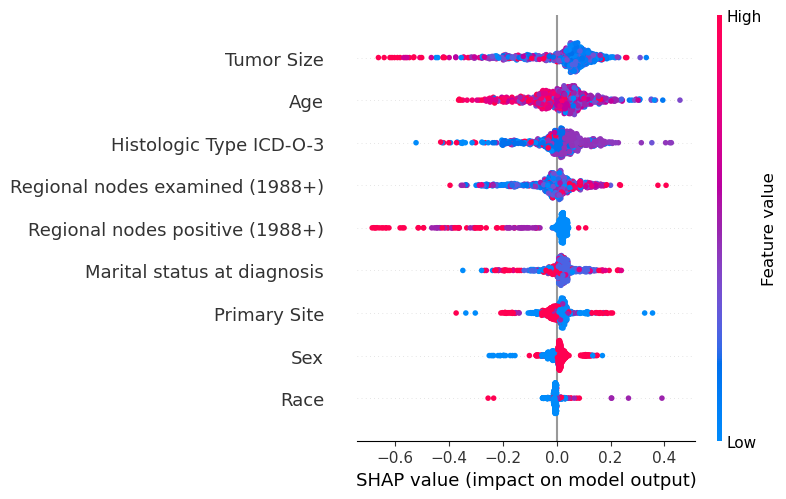

In [22]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(dt_shap_values, X_test)

Unmitigated Variable Importance Plot - Global Interpretation


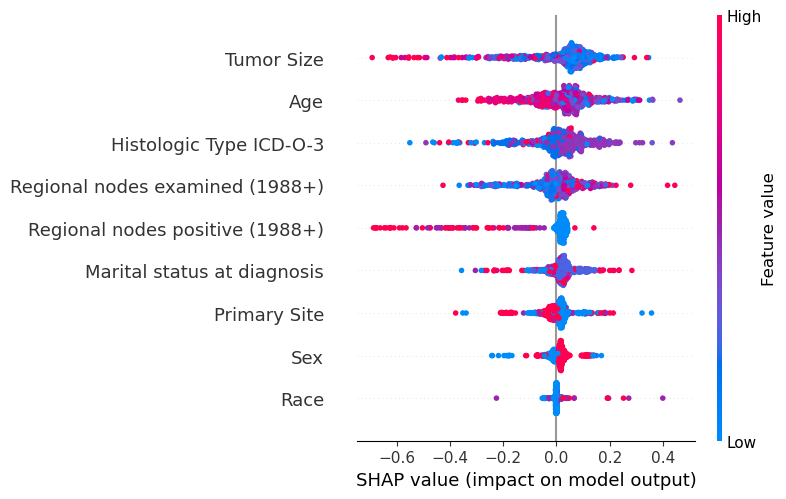

In [23]:
# Create the explainer
dt_unmitigated_explainer = shap.Explainer(dt.predict, X_train)
dt_unmitigated_shap_values = dt_unmitigated_explainer(X_test)
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(dt_unmitigated_shap_values, X_test)

## 2.2 LIME For Decision Tree

In [24]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
dt_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [25]:
# predict_fn_rf = lambda x: rf.predict_proba(x).astype(float)
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
dt_exp = dt_explainer.explain_instance(X_test.iloc[i], dt_exp_grad_red.predict_proba)
dt_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


In [26]:
dt_exp = dt_explainer.explain_instance(X_test.iloc[i], dt.predict_proba)
dt_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


# 3. Naive Bayes

In [32]:
from sklearn.naive_bayes import GaussianNB

nb_estimator = GaussianNB()
nb_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=nb_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
nb_exp_grad_red.fit(X_train, y_train)
nb_egr_acc = nb_exp_grad_red.score(X_test, y_test)
print(nb_egr_acc)

0.5847076461769115


In [31]:
# Without fairness
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)
nb_acc = accuracy_score(y_test, y_pred)
nb_acc

0.7781109445277361

## 3.1 SHAP For Naive Bayes

In [33]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
nb_explainer = shap.Explainer(nb_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
nb_shap_values = nb_explainer(X_test)

ExactExplainer explainer: 668it [00:47, 10.85it/s]                                                               


Mitigated Variable Importance Plot - Global Interpretation


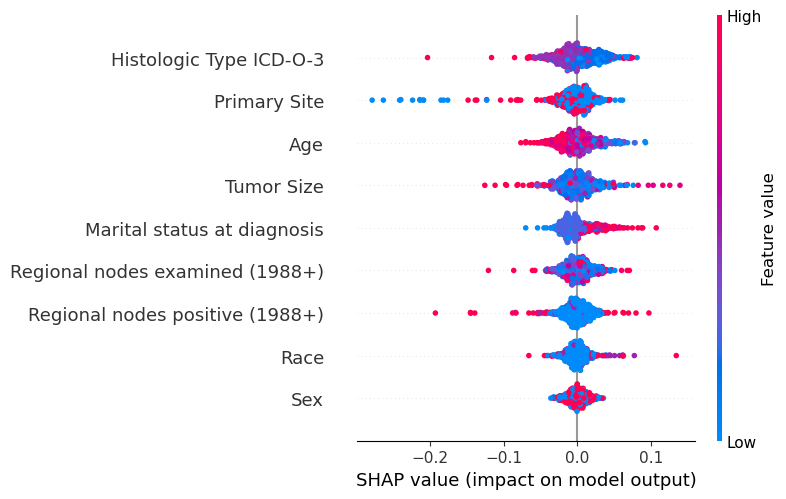

In [34]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(nb_shap_values, X_test)

In [35]:
# Create the explainer for unmitigated model
nb_unimitigated_explainer = shap.Explainer(nb.predict, X_train)

# Calculate SHAP values for the subset
nb_unimitigated_shap_values = nb_unimitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


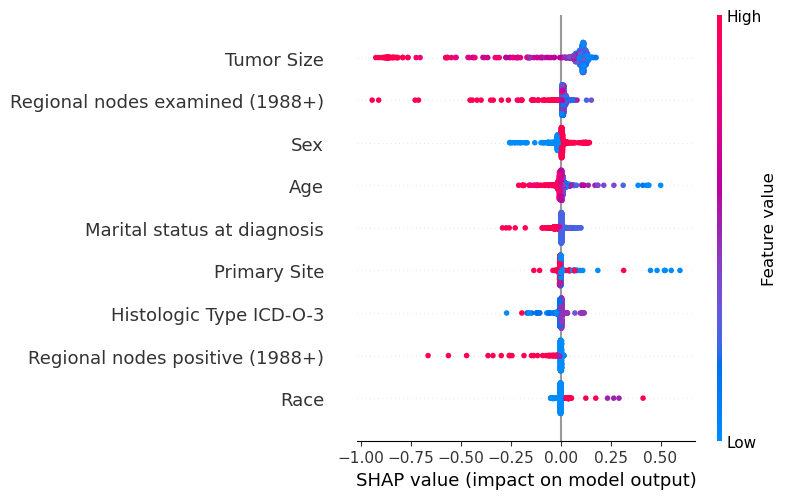

In [36]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(nb_unimitigated_shap_values, X_test)

## 3.2 LIME For Naive Bayes

In [37]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
nb_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [38]:
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
nb_exp = nb_explainer.explain_instance(X_test.iloc[i], nb_exp_grad_red.predict_proba)
nb_exp.show_in_notebook(show_all=False)

0


X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have valid feature names, but GaussianNB was fitted with feature names
X does not have 

In [39]:
nb_exp = nb_explainer.explain_instance(X_test.iloc[i], nb.predict_proba)
nb_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but GaussianNB was fitted with feature names


# 4. AdaBoost

In [40]:
from sklearn.ensemble import AdaBoostClassifier

ada_estimator = AdaBoostClassifier()
ada_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=ada_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
ada_exp_grad_red.fit(X_train, y_train)
ada_egr_acc = ada_exp_grad_red.score(X_test, y_test)
print(ada_egr_acc)

0.7541229385307346


In [41]:
# Without fairness
ada = AdaBoostClassifier()
ada.fit(X_train, y_train)
y_pred = ada.predict(X_test)
ada_acc = accuracy_score(y_test, y_pred)
ada_acc

0.7976011994002998

## 4.1 SHAP For AdaBoost

In [42]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
ada_explainer = shap.Explainer(ada_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
ada_shap_values = ada_explainer(X_test)

ExactExplainer explainer: 668it [17:02,  1.55s/it]                                                               


Mitigated Variable Importance Plot - Global Interpretation


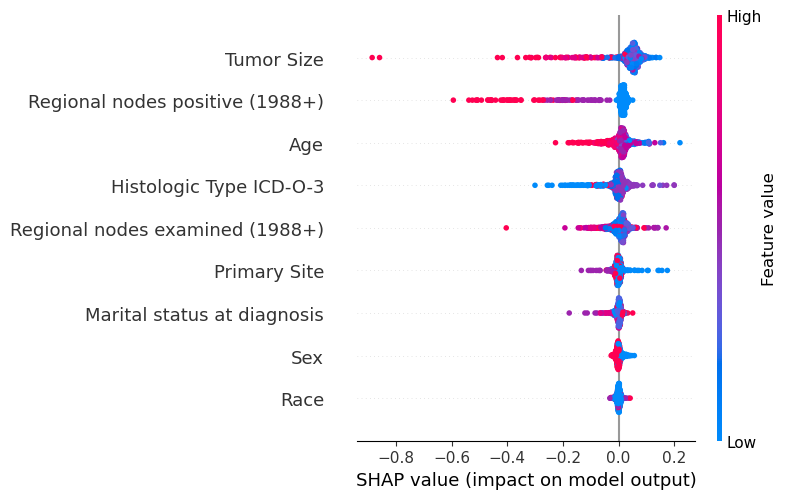

In [43]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(ada_shap_values, X_test)

In [44]:
# Create the explainer for unmitigated model
ada_unmitigated_explainer = shap.Explainer(ada.predict, X_train)

# Calculate SHAP values for the subset
ada_unmitigated_shap_values = ada_unmitigated_explainer(X_test)

ExactExplainer explainer: 668it [00:34, 13.65it/s]                                                               


Unmitigated Variable Importance Plot - Global Interpretation


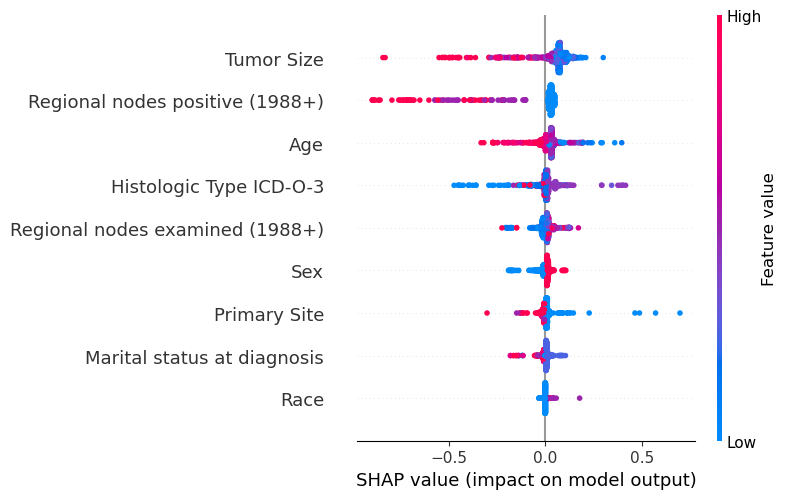

In [45]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(ada_unmitigated_shap_values, X_test)

## 4.2 LIME For AdaBoost

In [46]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
ada_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [47]:
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
ada_exp = ada_explainer.explain_instance(X_test.iloc[i], ada_exp_grad_red.predict_proba)
ada_exp.show_in_notebook(show_all=False)

1


X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
X does not

In [48]:
ada_exp = ada_explainer.explain_instance(X_test.iloc[i], ada.predict_proba)
ada_exp.show_in_notebook(show_all=False)

X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


# 5. XGBoost

In [49]:
from xgboost import XGBClassifier

xgb_estimator = XGBClassifier()
xgb_exp_grad_red = ExponentiatedGradientReduction(prot_attr=prot_attr_cols, 
                                              estimator=xgb_estimator, 
                                              constraints="EqualizedOdds",
                                              drop_prot_attr=False)
xgb_exp_grad_red.fit(X_train, y_train)
xgb_egr_acc = xgb_exp_grad_red.score(X_test, y_test)
print(xgb_egr_acc)

0.7811094452773614


In [50]:
# Without fairness
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
xgb_acc = accuracy_score(y_test, y_pred)
xgb_acc

0.7736131934032984

## 5.1 SHAP For XGBoost

In [51]:
# import shap and data visualization tool
import shap
import matplotlib.pyplot as plt

# load JS visualization code to notebook
shap.initjs()

# Create the explainer using the subset
xgb_explainer = shap.Explainer(xgb_exp_grad_red.predict, X_train)

# Calculate SHAP values for the subset
xgb_shap_values = xgb_explainer(X_test)

ExactExplainer explainer: 668it [05:08,  2.11it/s]                                                               


Mitigated Variable Importance Plot - Global Interpretation


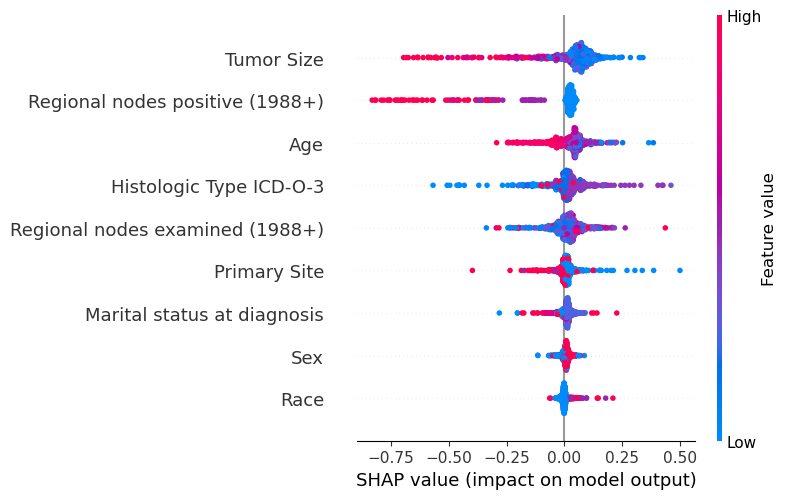

In [52]:
print("Mitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(xgb_shap_values, X_test)

In [53]:
# Create the explainer for unmitigated model
xgb_unmitigated_explainer = shap.Explainer(xgb.predict, X_train)

# Calculate SHAP values for the subset
xgb_unmitigated_shap_values = xgb_unmitigated_explainer(X_test)

Unmitigated Variable Importance Plot - Global Interpretation


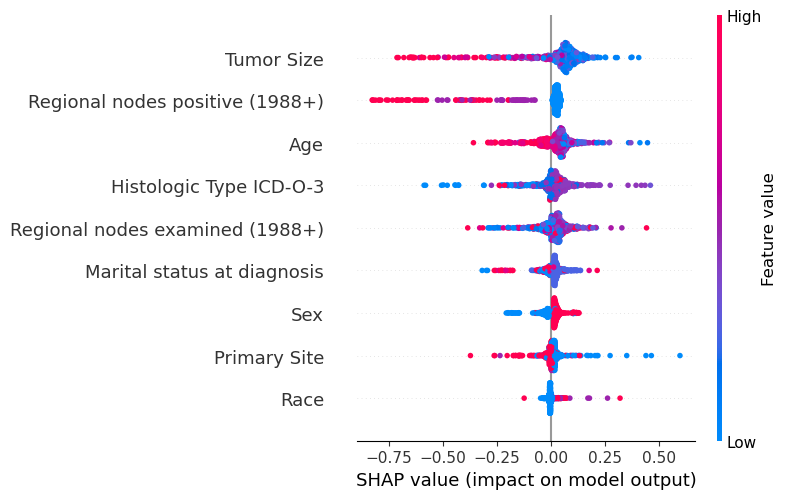

In [54]:
print("Unmitigated Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(xgb_unmitigated_shap_values, X_test)

## 5.2 LIME For XGBoost

In [54]:
# import the LimeTabularExplainer module
import lime
import lime.lime_tabular
import numpy as np


# get the feature names
feature_names = list(X_test.columns)

# Fit the Explainer on the training data set using the LimeTabularExplainer
xgb_explainer = lime.lime_tabular.LimeTabularExplainer(training_data=np.array(X_test),
                                 feature_names=X_test.columns,
                                 class_names = ['Dead', 'Alive'], 
                                 mode = 'classification')

In [57]:
i = np.random.randint(len(X_test))
print(y_test.iloc[i])
xgb_exp = xgb_explainer.explain_instance(X_test.iloc[i], xgb_exp_grad_red.predict_proba)
xgb_exp.show_in_notebook(show_all=False)

1


In [58]:
xgb_exp = xgb_explainer.explain_instance(X_test.iloc[i], xgb.predict_proba)
xgb_exp.show_in_notebook(show_all=False)